# Nifty Stock Market Data

**Nifty Stock Market Analyzing and Prediction :**

  The data is the price history and trading volumes of the fifty stocks in the index NIFTY 50 from NSE (National Stock Exchange) India. All datasets are at a day-level with pricing and trading values split across .cvs files for each stock along with a metadata file with some macro-information about the stocks itself. The data spans from 1st January, 2000 to 30th April, 2021.



## Getting Dataset


Dataset Source : https://www.kaggle.com/datasets/rohanrao/nifty50-stock-market-data


## Importing required modules

In [2]:
import os 
import pathlib
import pandas as pd
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
from sklearn.linear_model import LinearRegression
import pandas_profiling
from IPython.display import HTML, display, IFrame

## The Dataset

In [3]:
nifty_market_data_files = os.listdir("data")
del nifty_market_data_files[24]
nifty_market_data_files

['BAJFINANCE.csv',
 'HEROMOTOCO.csv',
 'TITAN.csv',
 'TATASTEEL.csv',
 'ASIANPAINT.csv',
 'RELIANCE.csv',
 'SUNPHARMA.csv',
 'NTPC.csv',
 'ULTRACEMCO.csv',
 'INFY.csv',
 'CIPLA.csv',
 'HINDUNILVR.csv',
 'MM.csv',
 'COALINDIA.csv',
 'BRITANNIA.csv',
 'POWERGRID.csv',
 'TATAMOTORS.csv',
 'IOC.csv',
 'ADANIPORTS.csv',
 'INDUSINDBK.csv',
 'HDFCBANK.csv',
 'BHARTIARTL.csv',
 'KOTAKBANK.csv',
 'WIPRO.csv',
 'INFRATEL.csv',
 'TCS.csv',
 'ITC.csv',
 'LT.csv',
 'DRREDDY.csv',
 'UPL.csv',
 'HDFC.csv',
 'GAIL.csv',
 'ONGC.csv',
 'VEDL.csv',
 'SBIN.csv',
 'TECHM.csv',
 'AXISBANK.csv',
 'BAJAJFINSV.csv',
 'NESTLEIND.csv',
 'BAJAJ-AUTO.csv',
 'GRASIM.csv',
 'HINDALCO.csv',
 'HCLTECH.csv',
 'ZEEL.csv',
 'JSWSTEEL.csv',
 'MARUTI.csv',
 'EICHERMOT.csv',
 'ICICIBANK.csv',
 'NIFTY50_all.csv',
 'SHREECEM.csv',
 'stock_metadata.csv']

In [4]:
df = pd.read_csv("data/" + nifty_market_data_files[0])
df.head()

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,2000-01-03,BAJAUTOFIN,EQ,46.95,49.45,50.75,46.5,50.75,50.75,50.05,7600,3.803800e+10,NaN,NaN,NaN
1,2000-01-04,BAJAUTOFIN,EQ,50.75,53.20,53.20,47.9,48.00,48.10,48.56,5000,2.428000e+10,NaN,NaN,NaN
2,2000-01-05,BAJAUTOFIN,EQ,48.10,46.55,47.40,44.6,44.60,44.60,45.47,3500,1.591450e+10,NaN,NaN,NaN
3,2000-01-06,BAJAUTOFIN,EQ,44.60,43.50,46.00,42.1,46.00,45.25,44.43,6200,2.754750e+10,NaN,NaN,NaN
4,2000-01-07,BAJAUTOFIN,EQ,45.25,48.00,48.00,42.0,42.90,42.90,44.44,3500,1.555550e+10,NaN,NaN,NaN


In [5]:
df.keys()

Index(['Date', 'Symbol', 'Series', 'Prev Close', 'Open', 'High', 'Low', 'Last',
       'Close', 'VWAP', 'Volume', 'Turnover', 'Trades', 'Deliverable Volume',
       '%Deliverble'],
      dtype='object')

In [6]:
df.isna().sum()

Date                     0
Symbol                   0
Series                   0
Prev Close               0
Open                     0
High                     0
Low                      0
Last                     0
Close                    0
VWAP                     0
Volume                   0
Turnover                 0
Trades                2779
Deliverable Volume     446
%Deliverble            446
dtype: int64

In [7]:
len(df)

5235

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5235 entries, 0 to 5234
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                5235 non-null   object 
 1   Symbol              5235 non-null   object 
 2   Series              5235 non-null   object 
 3   Prev Close          5235 non-null   float64
 4   Open                5235 non-null   float64
 5   High                5235 non-null   float64
 6   Low                 5235 non-null   float64
 7   Last                5235 non-null   float64
 8   Close               5235 non-null   float64
 9   VWAP                5235 non-null   float64
 10  Volume              5235 non-null   int64  
 11  Turnover            5235 non-null   float64
 12  Trades              2456 non-null   float64
 13  Deliverable Volume  4789 non-null   float64
 14  %Deliverble         4789 non-null   float64
dtypes: float64(11), int64(1), object(3)
memory usage: 613.6

## Analyzing Data

In [9]:
nifty_companies = nifty_market_data_files

for stuff in nifty_companies:
  print(stuff.replace(".csv", ""), end=", ")

BAJFINANCE, HEROMOTOCO, TITAN, TATASTEEL, ASIANPAINT, RELIANCE, SUNPHARMA, NTPC, ULTRACEMCO, INFY, CIPLA, HINDUNILVR, MM, COALINDIA, BRITANNIA, POWERGRID, TATAMOTORS, IOC, ADANIPORTS, INDUSINDBK, HDFCBANK, BHARTIARTL, KOTAKBANK, WIPRO, INFRATEL, TCS, ITC, LT, DRREDDY, UPL, HDFC, GAIL, ONGC, VEDL, SBIN, TECHM, AXISBANK, BAJAJFINSV, NESTLEIND, BAJAJ-AUTO, GRASIM, HINDALCO, HCLTECH, ZEEL, JSWSTEEL, MARUTI, EICHERMOT, ICICIBANK, NIFTY50_all, SHREECEM, stock_metadata, 

**Nifty's Company Chart**

Select One Of These: 

ICICIBANK, CIPLA, TITAN, INFRATEL, KOTAKBANK, HDFC, VEDL, POWERGRID, BAJAJFINSV, EICHERMOT, TATAMOTORS, MM, ZEEL, GRASIM, BAJFINANCE, HEROMOTOCO, HDFCBANK, LT, BAJAJ-AUTO, IOC, DRREDDY, INFY, ONGC, WIPRO, GAIL, HCLTECH, SBIN, JSWSTEEL, BRITANNIA, RELIANCE, ASIANPAINT, UPL, ULTRACEMCO, NIFTY50_all, NESTLEIND, HINDUNILVR, ITC, MARUTI, BHARTIARTL, BPCL, SUNPHARMA, NTPC, TCS, TATASTEEL, ADANIPORTS, INDUSINDBK, TECHM, HINDALCO, SHREECEM, AXISBANK, COALINDIA


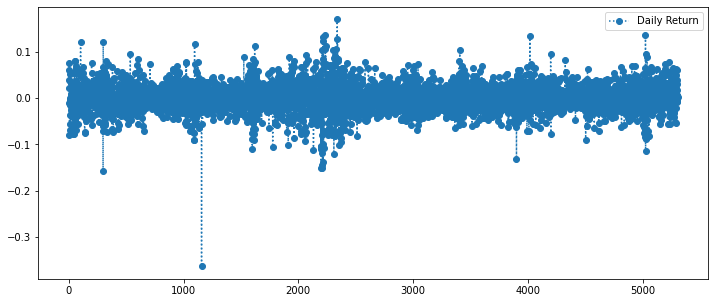

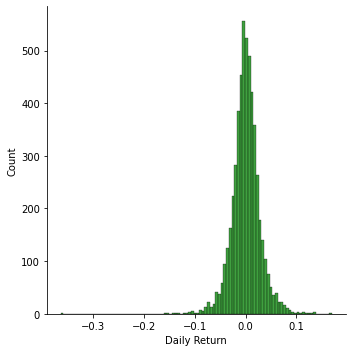

<ipython-input-10-963906ac5269>:37: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



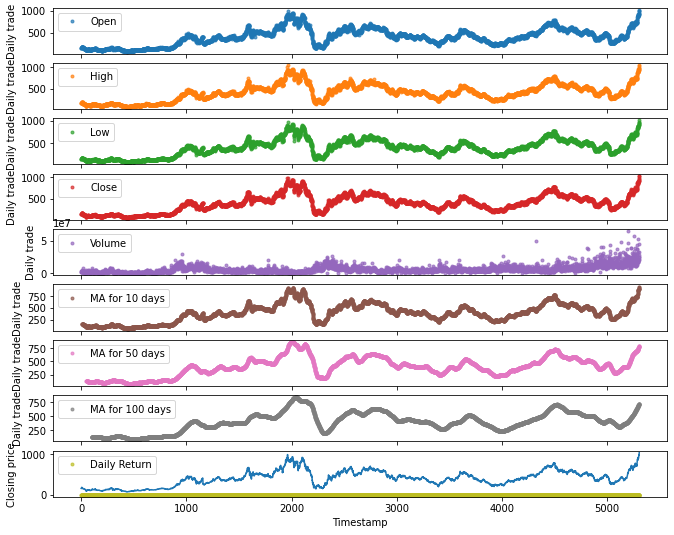

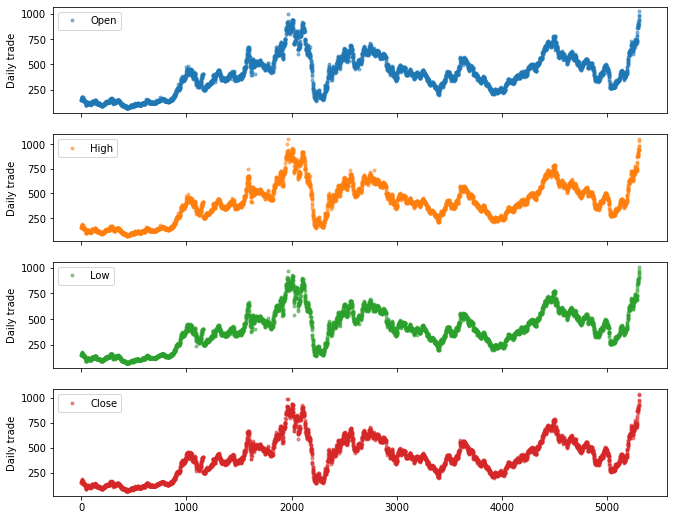

In [10]:
def plotNiftyGraph(company_name):
  data = pd.read_csv("data/" + company_name + ".csv")
  data["Date"] = pd.to_datetime(data["Date"])
  fig = go.Figure(data=[go.Candlestick(x=data['Date'],
                open=data['Open'],
                high=data['High'],
                low=data['Low'],
                close=data['Close'])])
  fig.update_layout(
      title='Nifty Candlestick Chart For \'' + company_name + "\'",
      yaxis_title='Nifty Price',
      xaxis_title='Date'
  )

  fig.show()

  ma_day = [10,50,100]

  for ma in ma_day:
      column_name = "MA for %s days" %(str(ma))
      data[column_name]=pd.DataFrame.rolling(data['Close'],ma).mean()

  data['Daily Return'] = data['Close'].pct_change()
  data['Daily Return'].plot(figsize=(12,5),legend=True,linestyle=':',marker='o')
  plt.show()

  sns.displot(data['Daily Return'].dropna(),bins=100,color='green')
  plt.show()

  date=pd.DataFrame(data['Date'])
  closing_df1 = pd.DataFrame(data['Close'])
  close1  = closing_df1.rename(columns={"Close": "data_close"})
  close2=pd.concat([date,close1],axis=1)
  close2.head()

  data.reset_index(drop=True, inplace=True)
  data.fillna(df.mean(), inplace=True)

  data.nunique()

  data.sort_index(axis=1,ascending=True)

  cols_plot = ['Open', 'High', 'Low','Close','Volume','MA for 10 days','MA for 50 days','MA for 100 days','Daily Return']
  axes = data[cols_plot].plot(marker='.', alpha=0.7, linestyle='None', figsize=(11, 9), subplots=True)
  for ax in axes:
      ax.set_ylabel('Daily trade')

  plt.plot(data['Close'], label="Close price")
  plt.xlabel("Timestamp")
  plt.ylabel("Closing price")
  data = data
  
  cols_plot = ['Open', 'High', 'Low','Close']
  axes = data[cols_plot].plot(marker='.', alpha=0.5, linestyle='None', figsize=(11, 9), subplots=True)
  for ax in axes:
      ax.set_ylabel('Daily trade')


select_company = "TATASTEEL" #@param {type:"string"}

plotNiftyGraph(select_company)

**Nifty's Company Analyzing** (Pandas Profiling)

<ipython-input-11-5fa15d9494c2>:4: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



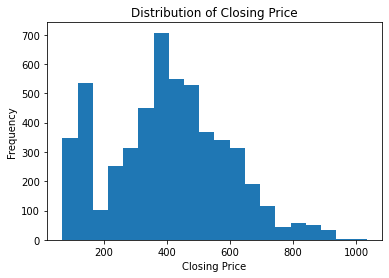

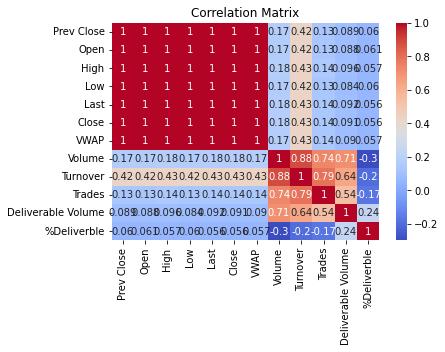

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Number of variables,15
Number of observations,5306
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,621.9 KiB
Average record size in memory,120.0 B
Categorical,3
Numeric,12
"Series has constant value ""EQ""",Constant


In [11]:
def analyzeNifty(company_name):
  df = pd.read_csv("data/" + company_name + ".csv")
  df.reset_index(drop=True, inplace=True)
  df.fillna(df.mean(), inplace=True)

  # Plot the distribution of the Closing Price using a histogram

  plt.hist(df['Close'], bins=20)
  plt.xlabel('Closing Price')
  plt.ylabel('Frequency')
  plt.title('Distribution of Closing Price')
  plt.show()

  # Plot the correlation matrix of the numerical columns using a heatmap
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
  plt.title('Correlation Matrix')
  plt.show()

  # Generate the report using Pandas Profiling
  profile = pandas_profiling.ProfileReport(df)
  html = HTML(profile.to_html())
  display(html)

company_name = "TATASTEEL" #@param {type:"string"}

analyzeNifty("TATASTEEL")

## Prediction

[ 148.    108.05  113.   ...  604.9   735.2  1024.  ]
[ 152.45  111.5   112.4  ...  636.1   742.9  1034.  ]


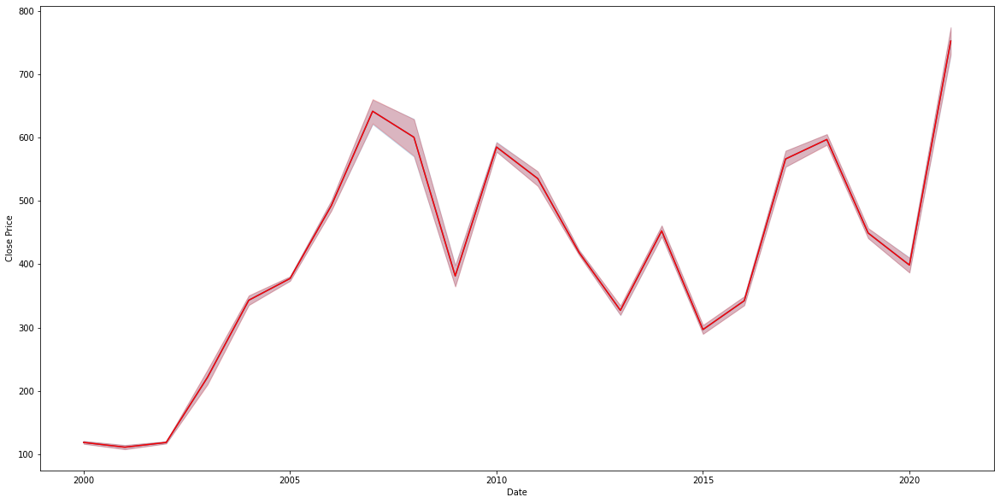

<ipython-input-12-48193f4943fb>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



572.9983844363305
601.681492931777


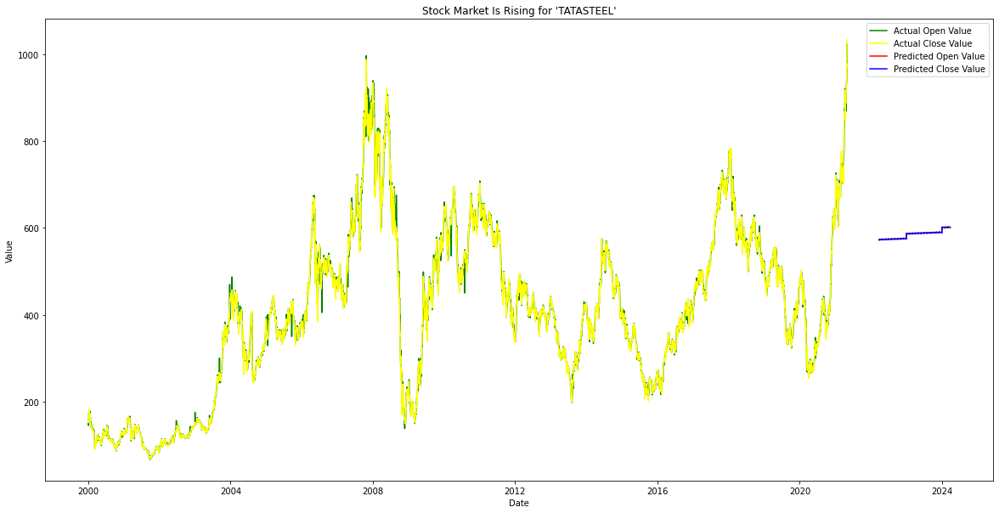

In [12]:
def predict_future_production(company_name, from_date_str, to_date_str):
  data = pd.read_csv("data/" + company_name + ".csv")
  data["Date"] = pd.to_datetime(data["Date"])
  data["Year"] = data["Date"].dt.year.values
  data = data.sort_values(by=["Year"])
  X_values = data[["Open", "High", "Low", "Last"]].values
  y_values = data["Close"].values
    
  lr = LinearRegression()
  lr.fit(X_values, y_values)

  predicted_values = lr.predict(X_values)
  plt.figure(figsize=(20, 10))
  print(X_values[:,0])
  print(y_values)
  sns.lineplot(x=data["Year"], y=y_values)
  sns.lineplot(x=data["Year"], y=predicted_values, color="red")
  plt.xlabel("Date")
  plt.ylabel("Close Price")
  plt.show()

  actual_trace = go.Scatter(x=data["Year"], y=y_values, name="Actual")

  predicted_trace = go.Scatter(x=data["Year"], y=predicted_values, name="Predicted", line=dict(color='red'))

  fig = go.Figure()
  fig.add_trace(actual_trace)
  fig.add_trace(predicted_trace)

  fig.update_layout(title='Nifty Prediction Chart For \'' + company_name + "\'", xaxis_title="Year", yaxis_title="Close Price")
  fig.show()

  

  data["Month"] = data["Date"].dt.month.astype('int').values
  data["Day"] = data["Date"].dt.day.astype('int').values

  X_values = data[["Day", "Month", "Year"]].values
  y_values = data[["Open", "Close"]].values

  lr = LinearRegression()
  lr.fit(X_values, y_values)

  from_date = datetime.datetime.strptime(from_date_str, "%Y-%m-%d")
  to_date = datetime.datetime.strptime(to_date_str, "%Y-%m-%d")

  date_range = pd.date_range(start=from_date, end=to_date, freq='D')

  df_pred = pd.DataFrame({'Date': date_range})
  df_pred['Day'] = df_pred['Date'].dt.day
  df_pred['Month'] = df_pred['Date'].dt.month
  df_pred['Year'] = df_pred['Date'].dt.year
  X_values_pred = df_pred[["Day", "Month", "Year"]].values

  predicted_values = lr.predict(X_values_pred)
  df_pred["Date"] = ""
  for i in range(0, len(X_values_pred)):
    df_pred["Date"][i] = str(df_pred["Year"][i]) + "-" + str(df_pred["Month"][i]) + "-" + str(df_pred["Day"][i])
  df_pred["Date"] = pd.to_datetime(df_pred["Date"])
  plt.figure(figsize=(20, 10))
  sns.lineplot(x=data["Date"], y=y_values[:, 0], label="Actual Open Value", color="green")
  sns.lineplot(x=data["Date"], y=y_values[:, 1], label="Actual Close Value", color="yellow")
  sns.lineplot(x=df_pred["Date"], y=predicted_values[:, 0], label="Predicted Open Value", color="red")
  sns.lineplot(x=df_pred["Date"], y=predicted_values[:, 1], label="Predicted Close Value", color="blue")
  plt.xlabel("Date")
  plt.ylabel("Value")
  print(predicted_values[0, 0])
  print(predicted_values[-1, 0])
  if predicted_values[0, 0] < predicted_values[-1, 0]:
    plt.title(f"Stock Market Is Rising for '{company_name}'")
  else:
    plt.title(f"Stock Market Is Falling for '{company_name}'")

  plt.legend()
  plt.show()

company_name = "TATASTEEL" #@param {type:"string"}
from_date = "2022-03-25" #@param {type:"date"}
to_date = "2024-03-25" #@param {type:"date"}


predict_future_production(company_name, from_date, to_date)